In [1]:
import os
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt

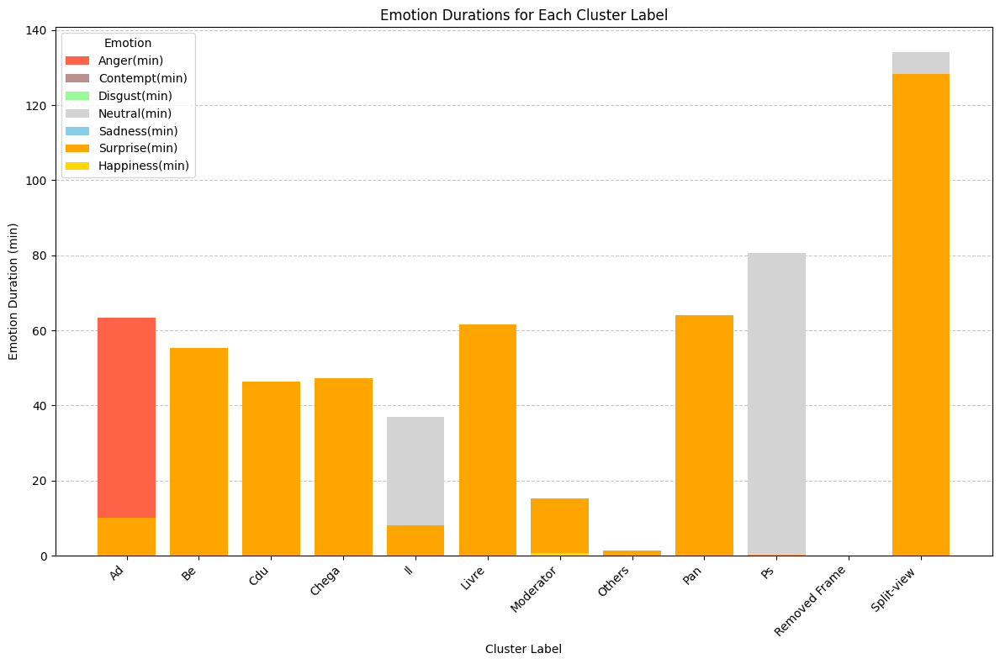

In [2]:
import matplotlib.pyplot as plt
import pandas as pd

# Data
data = {
    'Anger(min)': [63.40, 0.00, 0.26, 0.00, 0.00, 0.15, 1.16, 0.21, 0.21, 0.10, 0.00, 16.46],
    'Contempt(min)': [1.55, 0.37, 0.05, 0.06, 0.09, 0.05, 6.32, 0.36, 0.00, 0.04, 0.00, 44.55],
    'Disgust(min)': [0.01, 0.23, 0.03, 0.00, 7.55, 0.02, 4.08, 0.16, 2.30, 0.02, 0.02, 7.16],
    'Neutral(min)': [7.53, 4.29, 16.29, 7.45, 37.05, 0.06, 4.13, 0.17, 0.00, 80.57, 0.00, 134.05],
    'Sadness(min)': [0.23, 2.04, 1.13, 1.39, 3.19, 0.09, 3.48, 0.36, 0.00, 0.26, 0.00, 10.37],
    'Surprise(min)': [10.00, 55.29, 46.45, 47.19, 8.15, 61.58, 15.26, 1.43, 64.10, 0.21, 0.01, 128.29],
    'Happiness(min)': [0.01, 0.01, 0.00, 0.00, 0.01, 0.02, 0.59, 0.10, 0.02, 0.00, 0.00, 0.08]
}

cluster_labels = ["Ad", "Be", "Cdu", "Chega", "Il", "Livre", "Moderator", "Others", "Pan", "Ps", "Removed Frame", "Split-view "]

emotion_colors_min = {
    'Anger(min)': '#FF6347', 
    'Contempt(min)': '#BC8F8F',
    'Disgust(min)': '#98FB98',
    'Neutral(min)': '#D3D3D3', 
    'Sadness(min)': '#87CEEB',
    'Surprise(min)': '#FFA500',
    'Happiness(min)': '#FFD700'
}

# Convert the data to DataFrame
df = pd.DataFrame(data, index=cluster_labels)

# Plot
plt.figure(figsize=(12, 8))

# Iterate over each emotion column
for emotion, color in emotion_colors_min.items():
    # Plot each emotion separately with the specified color
    plt.bar(df.index, df[emotion], label=emotion, color=color, zorder=3)

plt.xlabel('Cluster Label')
plt.ylabel('Emotion Duration (min)')
plt.title('Emotion Durations for Each Cluster Label')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Emotion')
plt.grid(axis='y', linestyle='--', alpha=0.7, zorder=0)  # Add horizontal grid lines
plt.tight_layout()
plt.show()

In [2]:
current_dir = os.getcwd()

def read_all_videos_data():
    path = os.path.join(current_dir, 'processed')
    videos = [f for f in os.listdir(path) if f.endswith('.pkl')]
    video_titles = [f.split('.')[0] for f in videos]
    print("Number of debates:", len(video_titles))

    #load all the debates
    all_data = []
    i = 0
    print("Loading debates...")
    for video in videos:
        data_aux = pd.read_pickle(os.path.join(current_dir, 'processed', video))
        all_data.append(data_aux)
        i += 1

    print("All",len(videos),"debates loaded.")
    
    return all_data

def read_all_videos_data_cleaned():
    path = os.path.join(current_dir, 'processed')
    videos = [f for f in os.listdir(path) if f.endswith('.pkl')]
    video_titles = [f.split('.')[0] for f in videos]
    print("Number of debates:", len(video_titles))

    #load all the debates
    all_data = []
    i = 0
    print("Loading debates...")
    for video in videos:
        data_aux = pd.read_pickle(os.path.join(current_dir, 'processed', video))
        data_aux, _ = clean_df(data_aux)
        all_data.append(data_aux)
        i += 1

    print("All",len(videos)," cleaned debates loaded.")
    
    return all_data

In [3]:
def remove_intro_outro_frames(df):
    """
    Removes frames that are likely part of the introduction or outro based on the number of empty fields.

    Parameters:
    df (pd.DataFrame): The input dataframe containing frame data.

    Returns:
    tuple: A tuple containing the cleaned dataframe and the removed frames.
    """
    aux_df = df.copy()

    # List to store the number of empty fields for each row
    num_empty_fields = []
    
    # Iterate over each row in the dataframe
    for index, row in aux_df.iterrows():
        empty_fields = 0
        # Count the number of empty fields in the current row
        for field in row:
            if len(field) == 0:
                empty_fields += 1
        num_empty_fields.append(empty_fields)
    
    # Convert the list to a numpy array for easier indexing
    num_empty_fields = np.array(num_empty_fields)
    
    # Identify and separate the frames to be removed (those with more than 2 empty fields)
    removed_frames = aux_df[num_empty_fields > 2]
    
    # Keep only the frames that have 2 or fewer empty fields
    cleaned_df = aux_df[num_empty_fields <= 2]
    
    # Return the cleaned dataframe and the removed frames
    return cleaned_df, removed_frames

def clean_detections(df):
    """
    Cleans the 'detections' column in the dataframe by selecting only persons with confidence > 0.5
    and filtering out detections outside defined limits.

    Parameters:
    df (pd.DataFrame): The input dataframe containing detection data.

    Returns:
    pd.Series: A series containing the cleaned detections.
    """
    # Create a copy of the relevant columns
    detections_df = df[['filename', 'detections']].copy()

    # Initialize a list to store persons with confidence > 0.5
    persons = []
    
    # Iterate over each detection in the dataframe
    for detection in detections_df['detections']:
        person_in_limits = []
        for obj in detection:
            if obj[4] == 'person' and obj[5] > 0.5:
                person_in_limits.append(obj)
        persons.append(person_in_limits)
    
    # Add the filtered persons to the dataframe
    detections_df['persons'] = persons

    # Further filter the persons to include only those within defined spatial limits
    persons = []
    for detection in detections_df['persons']:
        person_in_limits = []
        for obj in detection:
            x, y, w, h = obj[0], obj[1], obj[2], obj[3]
            x = x + w / 2
            y = y + h / 2
            if y < 525 and x > 125 and x < 1125 and w*h > 150000:
                person_in_limits.append(obj)
        persons.append(person_in_limits)
    
    # Update the dataframe with the filtered persons
    detections_df['persons_in_limits'] = persons
    
    # Return the cleaned 'persons_in_limits' series
    return detections_df['persons_in_limits']

def clean_fer(df):
    """
    Cleans the 'fer' column in the dataframe by filtering out faces outside defined limits
    and removing faces with an area below a specified threshold.

    Parameters:
    df (pd.DataFrame): The input dataframe containing FER (Facial Emotion Recognition) data.

    Returns:
    pd.Series: A series containing the cleaned FER data.
    """
    # Create a copy of the relevant columns
    fer_df = df[['filename', 'fer']].copy()

    # Initialize a list to store faces within defined spatial limits
    faces = []
    
    # Iterate over each frame in the FER data
    for frame in fer_df['fer']:
        faces_in_limits = []
        for face in frame:
            location = face['location']
            x1, x2, y1, y2 = location[0], location[1], location[2], location[3]
            x = (x1 + x2) / 2
            y = (y1 + y2) / 2
            if y < 470 and x > 125 and x < 1125:
                faces_in_limits.append(face)
        faces.append(faces_in_limits)
    
    # Add the filtered faces to the dataframe
    fer_df['faces_in_limits'] = faces

    # Define the area threshold for filtering faces
    area_threshold = 25000
    
    # Initialize a list to store faces with area above the threshold
    faces = []
    
    # Iterate over each frame in the 'faces_in_limits' data
    for frame in fer_df['faces_in_limits']:
        faces_above_area = []
        for face in frame:
            location = face['location']
            x1, x2, y1, y2 = location[0], location[1], location[2], location[3]
            w, h = x2 - x1, y2 - y1
            area = w * h
            if area > area_threshold:
                faces_above_area.append(face)
        faces.append(faces_above_area)
    
    # Update the dataframe with the filtered faces
    fer_df['faces_in_limits_above_area'] = faces
    
    # Return the cleaned 'faces_in_limits_above_area' series
    return fer_df['faces_in_limits_above_area']

def clean_df(df):
    """
    Cleans the input dataframe by removing outliers and cleaning specific columns.

    Parameters:
    df (pd.DataFrame): The input dataframe to be cleaned.

    Returns:
    pd.DataFrame: The cleaned dataframe.
    """
    cleaned_df = df.copy()
    cleaned_df, removed_frames= remove_intro_outro_frames(cleaned_df)
    cleaned_df['detections'] = clean_detections(df)
    cleaned_df['fer'] = clean_fer(df)
    
    return cleaned_df, removed_frames

In [12]:
def bar_plot_dataframe(data_tuple, title):
    num_frames, num_detections, num_poses, num_faces, num_text, num_embedding, num_fer = data_tuple
    fig = go.Figure()

    fig.add_trace(go.Bar(
        x=['frames', 'detections', 'poses', 'faces', 'text', 'embedding', 'fer'], 
        y=[num_frames, num_detections, num_poses, num_faces, num_text, num_embedding, num_fer],
        text=[num_frames, num_detections, num_poses, num_faces, num_text, num_embedding, num_fer],
        textposition='auto'
    ))

    fig.update_layout(title=title, xaxis_title='Type', yaxis_title='Number of instances')
    fig.show()
    
def plot_all_debates_face_centers(all_data):
    """
    Plot faces centers for all debates.
    
    Parameters:
    all_data (list): List of DataFrames containing the data for all debates.
    """
    fig = go.Figure()

    for data in all_data:
        face_centers = []
        for frame in data['fer']:
            for face in frame:
                location = face['location']
                x1, x2, y1, y2 = location[0], location[1], location[2], location[3]
                x = (x1 + x2) / 2
                y = (y1 + y2) / 2
                face_centers.append([x, y])
        face_centers = np.array(face_centers)
        fig.add_trace(go.Scatter(x=face_centers[:, 0], y=face_centers[:, 1], mode='markers', marker=dict(size=3), opacity=0.8))

    fig.update_layout(
        title='Face centers - all debates',
        xaxis=dict(range=[0, 1280], title='x', showline=True, linewidth=0.5, linecolor='black', mirror=True, scaleanchor="y"),
        yaxis=dict(range=[0, 720], title='y', showline=True, linewidth=0.5, linecolor='black', mirror=True, autorange='reversed', scaleratio=1280/720),
        autosize=False,
        #width=800,
        showlegend=False#,
        #annotations=[
        #    dict(x=1280/2 - 150, y=550, text='Conditions:', showarrow=False, font=dict(size=10)),
        #    dict(x=1280/2, y=550, text='y < 470', showarrow=False, font=dict(size=10)),
        #    dict(x=1280/2, y=600, text='x > 125', showarrow=False, font=dict(size=10)),
        #    dict(x=1280/2, y=650, text='x < 1125', showarrow=False, font=dict(size=10))
        #],
        #shapes=[
        #    dict(type='line', yref='paper', y0=0, y1=1, xref='x', x0=125, x1=125, line=dict(color='black', dash='dash')),
        #    dict(type='line', yref='paper', y0=0, y1=1, xref='x', x0=1125, x1=1125, line=dict(color='black', dash='dash')),
        #    dict(type='line', xref='paper', x0=0, x1=1, yref='y', y0=470, y1=470, line=dict(color='black', dash='dash'))
        #]
    )
    fig.show()

def plot_all_debates_person_centers(all_data):
    """
    Plot person centers for all debates.
    
    Parameters:
    all_data (list): List of DataFrames containing the data for all debates.
    """
    fig = go.Figure()

    for data in all_data:
        person_centers = []
        for detection in data['detections']:
            for obj in detection:
                if obj[4] == 'person' and obj[5] > 0.5:
                    x, y, w, h = obj[0], obj[1], obj[2], obj[3]
                    x = x + w / 2
                    y = y + h / 2
                    person_centers.append([x, y])
        person_centers = np.array(person_centers)
        fig.add_trace(go.Scatter(x=person_centers[:, 0], y=person_centers[:, 1], mode='markers', marker=dict(size=3), opacity=0.8))

    fig.update_layout(
        title='Person centers - all debates',
        xaxis=dict(range=[0, 1280], title='x', showline=True, linewidth=0.5, linecolor='black', mirror=True, scaleanchor="y"),
        yaxis=dict(range=[0, 720], title='y', showline=True, linewidth=0.5, linecolor='black', mirror=True, autorange='reversed', scaleratio=1280/720),
        autosize=False,
        #width=800,
        showlegend=False#,
        #annotations=[
        #    dict(x=1280/2 - 150, y=550, text='Conditions:', showarrow=False, font=dict(size=10)),
        #    dict(x=1280/2, y=550, text='y < 720', showarrow=False, font=dict(size=10)),
        #    dict(x=1280/2, y=600, text='x > 125', showarrow=False, font=dict(size=10)),
        #    dict(x=1280/2, y=650, text='x < 1125', showarrow=False, font=dict(size=10))
        #],
        #shapes=[
        #    dict(type='line', yref='paper', y0=0, y1=1, xref='x', x0=125, x1=125, line=dict(color='black', dash='dash')),
        #    dict(type='line', yref='paper', y0=0, y1=1, xref='x', x0=1125, x1=1125, line=dict(color='black', dash='dash')),
        #    dict(type='line', xref='paper', x0=0, x1=1, yref='y', y0=525, y1=525, line=dict(color='black', dash='dash'))
        #]
    )
    fig.show()
    
def plot_all_debates_face_area(all_data):
    face_area_lst_all = []
    for data in all_data:
        for frame in data['fer']:
            for face in frame:
                location = face['location']
                x1, x2, y1, y2 = location[0], location[1], location[2], location[3]
                w, h = x2 - x1, y2 - y1
                face_area_lst_all.append(w * h)
    fig = go.Figure()
    fig.add_trace(go.Histogram(x=face_area_lst_all, nbinsx=250, xbins=dict(start=0, end=150000), marker=dict(color='green')))
    fig.update_layout(
        title=dict(text='Faces (fer) area histogram - all debates', font=dict(size=25)),
        xaxis=dict(title='Face area (pixels)', showline=True, linewidth=0.5, linecolor='black', mirror=True),
        yaxis=dict(title='Number of faces', showline=True, linewidth=0.5, linecolor='black', mirror=True),
        shapes=[
            dict(type='line', yref='paper', y0=0, y1=1, xref='x', x0=38000, x1=38000,line=dict(color='black', dash='dash'))
        ],
        annotations=[
            dict(x=31000, y=8500, text='Threshold:', showarrow=False, font=dict(size=10)),
            dict(x=31000, y=6500, text='x = 38.000', showarrow=False, font=dict(size=10))
        ]
    )
    fig.show()
    
def plot_all_debates_person_area(all_data):
    face_area_lst_all = []
    for data in all_data:
        for frame in data['detections']:
            for object in frame:
                if object[4] == 'person' and object[5] > 0.75:
                    width, height = object[2], object[3]
                    face_area_lst_all.append(width * height)
    fig = go.Figure()
    fig.add_trace(go.Histogram(x=face_area_lst_all, nbinsx=100, xbins=dict(start=0, end=1000000)))
    fig.update_layout(
        title=dict(text='Person (detections) area histogram - all debates', font=dict(size=25)),
        xaxis=dict(title='Person area (pixels)', showline=True, linewidth=0.5, linecolor='black', mirror=True),
        yaxis=dict(title='Number of persons', showline=True, linewidth=0.5, linecolor='black', mirror=True),
        shapes=[
            dict(type='line', yref='paper', y0=0, y1=1, xref='x', x0=150000, x1=150000,line=dict(color='black', dash='dash'))
        ],
        annotations=[
            dict(x=100000, y=3500, text='Threshold:', showarrow=False, font=dict(size=10)),
            dict(x=100000, y=2900, text='x = 150.000', showarrow=False, font=dict(size=10))
        ]
    )
    fig.show()
    
def plot_all_debates_object_types(all_data, threshold=0):
    object_dict = {}
    for data in all_data:
        for frame in data['detections']:
            for object in frame:
                if object[5] > threshold:
                    if object[4] not in object_dict:
                        object_dict[object[4]] = 1
                    else:
                        object_dict[object[4]] += 1
                    
    fig = go.Figure()
    fig.add_trace(go.Bar(
        x=list(object_dict.keys()), 
        y=list(object_dict.values()),
        text=list(object_dict.values()),
        textposition='auto'
    ))
    
    title = 'Objects detected with confidence higher than ' + str(int(threshold * 100))  + '% - all debates'
    fig.update_layout(
        title=dict(text=title, font=dict(size=20)),
        xaxis=dict(title='Type of object', title_font=dict(size=15), showline=True, linewidth=0.5, linecolor='black', mirror=True),
        yaxis=dict(title='Number of detections', title_font=dict(size=15),showline=True, linewidth=0.5, linecolor='black', mirror=True),
    )
    
    fig.show()


In [5]:
video = 'ad-ps'
current_dir = os.getcwd()
data = pd.read_pickle(os.path.join('processed', video + '.pkl'))

In [6]:
num_frames = data.shape[0]
num_detections = data['detections'].apply(len).sum()
num_poses = data['poses'].apply(len).sum()
num_faces = data['faces'].apply(len).sum()
num_text = data['text'].apply(len).sum()
num_embedding = int(data['embedding'].apply(len).sum()/1024)
num_fer = data['fer'].apply(len).sum()

title = 'Dataframe Characterization of ' + video + ' video'
bar_plot_dataframe((num_frames, num_detections, num_poses, num_faces,num_text, num_embedding, num_fer), title)

In [7]:
all_data = read_all_videos_data()

num_frames = 0
num_detections = 0
num_poses = 0
num_faces = 0
num_text = 0
num_embedding = 0
num_fer = 0

for data in all_data:
    num_frames += data.shape[0]
    num_detections += data['detections'].apply(len).sum()
    num_poses += data['poses'].apply(len).sum()
    num_faces += data['faces'].apply(len).sum()
    num_text += data['text'].apply(len).sum()
    num_embedding += int(data['embedding'].apply(len).sum()/1024)
    num_fer += data['fer'].apply(len).sum()
    
title = 'Dataframe Characterization of all videos'
bar_plot_dataframe((num_frames, num_detections, num_poses, num_faces,num_text, num_embedding, num_fer), title)


Number of debates: 28
Loading debates...
All 28 debates loaded.


In [13]:
plot_all_debates_person_centers(all_data)
plot_all_debates_face_centers(all_data)

In [9]:
all_data_cleaned = read_all_videos_data_cleaned()

num_frames = 0
num_detections = 0
num_poses = 0
num_faces = 0
num_text = 0
num_embedding = 0
num_fer = 0

for data in all_data_cleaned:
    num_frames += data.shape[0]
    num_detections += data['detections'].apply(len).sum()
    num_poses += data['poses'].apply(len).sum()
    num_faces += data['faces'].apply(len).sum()
    num_text += data['text'].apply(len).sum()
    num_embedding += int(data['embedding'].apply(len).sum()/1024)
    num_fer += data['fer'].apply(len).sum()
    
title = 'Dataframe Characterization of all videos after cleaning'
bar_plot_dataframe((num_frames, num_detections, num_poses, num_faces,num_text, num_embedding, num_fer), title)

Number of debates: 28
Loading debates...
All 28  cleaned debates loaded.


In [10]:
plot_all_debates_face_area(all_data)
plot_all_debates_person_area(all_data)

In [11]:
plot_all_debates_object_types(all_data)
plot_all_debates_object_types(all_data, threshold=0.75)